In [1]:
import os
import cv2
import numpy as np
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
from glob import glob
import pandas as pd
from collections import defaultdict
import itertools
import csv

In [65]:
def draw_contours(image, contours, labels=None):
    boxed = image.copy()
    for i, cnt in enumerate(contours):
        # Draw bounding box in green
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(boxed, (x, y), (x + w, y + h), (0, 255, 0), 3)

        # Draw contour in red
        cv2.drawContours(boxed, [cnt], -1, (0, 0, 255), 2)  # Red contour

        # Optional label
        if labels and i < len(labels):
            cv2.putText(boxed, labels[i], (x, y + 40), cv2.FONT_HERSHEY_SIMPLEX,
                        2.0, (255, 0, 255), 4, lineType=cv2.LINE_AA)
    return boxed


In [66]:
def draw_contours_with_patch(image, contours, labels=None, patch_boxes=None):
    boxed = image.copy()

    for i, cnt in enumerate(contours):
        # Draw bounding box in green
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(boxed, (x, y), (x + w, y + h), (0, 255, 0), 3)

        # Draw contour in red
        cv2.drawContours(boxed, [cnt], -1, (0, 0, 255), 2)

        # Draw patch used for histogram in blue (if provided)
        if patch_boxes and i < len(patch_boxes):
            px, py, pw, ph = patch_boxes[i]
            cv2.rectangle(boxed, (px, py), (px + pw, py + ph), (255, 0, 0), 2)

        # Optional label
        if labels and i < len(labels):
            cv2.putText(boxed, labels[i], (x, y + 40), cv2.FONT_HERSHEY_SIMPLEX,
                        2.0, (255, 0, 255), 4, lineType=cv2.LINE_AA)

    return boxed


In [4]:
# --------- Step 1: K-means Color Clustering ---------
def kmeans_clustering(image, k=4):
    Z = image.reshape((-1, 3))
    Z = np.float32(Z)
    kmeans = KMeans(n_clusters=k, random_state=0).fit(Z)
    labels = kmeans.labels_.reshape(image.shape[:2])
    clustered_img = kmeans.cluster_centers_[labels].reshape(image.shape).astype(np.uint8)
    # return clustered_img, labels
    return clustered_img, labels

In [5]:
def choose_k_by_colorfulness(image, cluster_check_k=6, area_threshold=0.15):
    # Resize to speed up
    small = cv2.resize(image, (100, 100))
    Z = small.reshape((-1, 3))
    Z = np.float32(Z)
    kmeans = KMeans(n_clusters=cluster_check_k, random_state=0).fit(Z)
    labels = kmeans.labels_
    centers = np.uint8(kmeans.cluster_centers_)

    # Convert centers to HSV
    hsv_centers = cv2.cvtColor(centers[np.newaxis, :, :], cv2.COLOR_BGR2HSV)[0]

    vibrant_area = 0
    total_pixels = labels.shape[0]

    for idx, (h, s, v) in enumerate(hsv_centers):
        if s > 50 and not (10 <= h <= 40):
            area_fraction = np.sum(labels == idx) / total_pixels
            vibrant_area += area_fraction

    chosen_k = 4 if vibrant_area > area_threshold else 2
    return chosen_k, vibrant_area


In [6]:
def hue_vibrancy_score(hue):
    # Strongest vibrancy for red/yellow/orange/magenta
    if hue < 15 or hue > 160:
        return 1.0   # Red/Pink
    elif 15 <= hue <= 35:
        return 0.9   # Orange-Yellow
    elif 35 < hue <= 80:
        return 0.6   # Green
    elif 80 < hue <= 130:
        return 0.4   # Cyan-blue
    elif 130 < hue <= 160:
        return 0.5   # Purple
    else:
        return 0.2   # Default fallback


In [7]:
def choose_k_by_colorfulness(image, cluster_check_k=6, threshold=0.15):
    small = cv2.resize(image, (100, 100))
    Z = small.reshape((-1, 3))
    Z = np.float32(Z)
    kmeans = KMeans(n_clusters=cluster_check_k, random_state=0).fit(Z)
    labels = kmeans.labels_
    centers = np.uint8(kmeans.cluster_centers_)

    hsv_centers = cv2.cvtColor(centers[np.newaxis, :, :], cv2.COLOR_BGR2HSV)[0]

    total_pixels = labels.shape[0]
    weighted_vibrancy = 0.0

    for idx, (h, s, v) in enumerate(hsv_centers):
        if s > 50:
            area_fraction = np.sum(labels == idx) / total_pixels
            vibrancy_score = hue_vibrancy_score(h)
            weighted_vibrancy += area_fraction * vibrancy_score

    chosen_k = 4 if weighted_vibrancy > threshold else 2
    return chosen_k, weighted_vibrancy


In [8]:
def extract_class_masks(labels, num_classes=4):
    masks = []
    for i in range(num_classes):
        mask = np.uint8(labels == i) * 255
        masks.append(mask)
    return masks

In [9]:
def clean_mask(mask):
    # Larger kernels to suppress small dots and merge nearby blobs
    kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))
    kernel_close = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15))

    opened = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel_open)
    closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel_close)
    
    # Optional: strengthen structure further
    dilated = cv2.dilate(closed, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7)), iterations=1)
    return dilated

In [10]:
def get_contours_from_mask(mask, min_area=1500, size_range=(200, 1200)): #Change here 450 to 700
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered = []
    for c in contours:
        x, y, w, h = cv2.boundingRect(c)
        if (min_area < cv2.contourArea(c) and
            size_range[0] <= w <= size_range[1] and
            size_range[0] <= h <= size_range[1]):
            filtered.append(c)
    return filtered

In [ ]:
# --------- Step 3: Histogram Extraction ---------
# def extract_histogram(img, contour):
#     x, y, w, h = cv2.boundingRect(contour)
#     roi = img[y:y+h, x:x+w]
#     hist = cv2.calcHist([roi], [0, 1, 2], None, [8,8,8], [0,256,0,256,0,256])
#     cv2.normalize(hist, hist)
#     return hist.flatten()

def extract_histogram(img, contour, patch_size=(214, 208)):
    x, y, w, h = cv2.boundingRect(contour)
    roi = img[y:y+h, x:x+w]

    patch_h, patch_w = patch_size

    if roi.shape[0] < patch_h or roi.shape[1] < patch_w:
        patch = roi
        patch_coords = (x, y, roi.shape[1], roi.shape[0])
    else:
        min_std = float('inf')
        best_patch = None
        best_coords = None

        for i in range(0, roi.shape[0] - patch_h + 1, 10):
            for j in range(0, roi.shape[1] - patch_w + 1, 10):
                window = roi[i:i+patch_h, j:j+patch_w]
                std = np.std(window)
                if std < min_std:
                    min_std = std
                    best_patch = window
                    best_coords = (x + j, y + i, patch_w, patch_h)

        patch = best_patch if best_patch is not None else roi
        patch_coords = best_coords if best_coords else (x, y, roi.shape[1], roi.shape[0])

    hist = cv2.calcHist([patch], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
    cv2.normalize(hist, hist)
    return hist.flatten(), patch_coords



def match_histogram(hist, reference_histograms):
    return max(reference_histograms.items(),
               key=lambda item: cv2.compareHist(hist, item[1], cv2.HISTCMP_CORREL))[0]

In [29]:
def load_reference_histograms_from_annotations(csv_path, train_folder, visualize=True, max_dim=1000):
    df = pd.read_csv(csv_path)
    histograms_by_class = defaultdict(list)

    for _, row in df.iterrows():
        filename = row['filename']
        img_path = os.path.join(train_folder, filename)
        img = cv2.imread(img_path)
        if img is None:
            print(f"Warning: Failed to load image {img_path}")
            continue

        x_min, y_min, x_max, y_max = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])
        cls = row['class']
        
        dy = y_max - y_min
        dx = x_max - x_min

        new_xmin = int(x_min + 0.2 * dx)
        new_ymin = int(y_min + 0.2 * dy)
        new_xmax = int(x_max - 0.2 * dx)
        new_ymax = int(y_max - 0.2 * dy)

        roi = img[new_ymin:new_ymax, new_xmin:new_xmax]
        if roi.size == 0:
            print(f"Warning: Empty ROI for {filename} {cls}")
            continue

        # --- Visualization with resizing ---
        if visualize:
            img_copy = img.copy()

            # Determine scale factor
            h, w = img_copy.shape[:2]
            scale = min(max_dim / h, max_dim / w)
            new_size = (int(w * scale), int(h * scale))
            img_resized = cv2.resize(img_copy, new_size)

            # Scale bounding box coordinates
            sx, sy = scale, scale
            xmin_s = int(new_xmin * sx)
            ymin_s = int(new_ymin * sy)
            xmax_s = int(new_xmax * sx)
            ymax_s = int(new_ymax * sy)

            cv2.rectangle(img_resized, (xmin_s, ymin_s), (xmax_s, ymax_s), (0, 255, 0), 2)
            cv2.putText(img_resized, cls, (xmin_s, ymin_s - 10), cv2.FONT_HERSHEY_SIMPLEX,
                        1.0, (0, 0, 255), 2, cv2.LINE_AA)

            cv2.imshow("ROI Preview", img_resized)
            key = cv2.waitKey(0)
            if key == ord('q'):
                break
        # -----------------------------------

        hist = cv2.calcHist([roi], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
        cv2.normalize(hist, hist)
        histograms_by_class[cls].append(hist.flatten())

    cv2.destroyAllWindows()

    # Compute mean histogram per class
    mean_histograms = {}
    for cls, hist_list in histograms_by_class.items():
        mean_hist = np.mean(hist_list, axis=0)
        mean_histograms[cls] = mean_hist

    print(f"Computed histograms for {len(mean_histograms)} classes.")
    return mean_histograms


In [ ]:
def load_reference_histograms(ref_folder):
    histograms = {}
    for path in glob(os.path.join(ref_folder, '*.jpg')):
        img = cv2.imread(path)
        clustered_img, labels = kmeans_clustering(img, k=4)
        masks = extract_class_masks(labels)
        for i, mask in enumerate(masks):
            cleaned = clean_mask(mask)
            contours = get_contours_from_mask(cleaned)
            if contours:
                hist = extract_histogram(img, contours[0])[0]
                filename = os.path.basename(path)
                class_name = filename.split('_JPG')[0]
                histograms[class_name] = hist
                break
    return histograms


In [13]:
# # --------- Visualization ---------
# def display_results(orig, clustered, contours, labels):
#     clustered_boxes = draw_contours(clustered, contours)
#     original_boxes = draw_contours(orig.copy(), contours)
#     labeled_img = draw_contours(orig.copy(), contours, labels)

#     fig, axs = plt.subplots(1, 3, figsize=(20, 8))  # Slightly larger figure
#     axs[0].imshow(cv2.cvtColor(clustered_boxes, cv2.COLOR_BGR2RGB))
#     axs[0].set_title('K-means with BBoxes', fontsize=24)
#     axs[1].imshow(cv2.cvtColor(original_boxes, cv2.COLOR_BGR2RGB))
#     axs[1].set_title('Original with BBoxes', fontsize=24)
#     axs[2].imshow(cv2.cvtColor(labeled_img, cv2.COLOR_BGR2RGB))
#     axs[2].set_title('Final Classification', fontsize=24)

#     for ax in axs:
#         ax.axis('off')

#     plt.tight_layout()
#     plt.show()



In [31]:
# --------- Histogram Matching with Object Filtering ---------
def match_histogram_dual(hist, ref_chocolates, ref_objects):
    best_label = None
    best_score = -1

    # Compare to chocolate reference histograms
    for label, ref_hist in ref_chocolates.items():
        score = cv2.compareHist(hist, ref_hist, cv2.HISTCMP_CORREL)
        if score > best_score:
            best_score = score
            best_label = label
            best_from = 'chocolate'

    # Compare to object reference histograms
    for label, ref_hist in ref_objects.items():
        score = cv2.compareHist(hist, ref_hist, cv2.HISTCMP_CORREL)
        if score > best_score:
            best_score = score
            best_label = label
            best_from = 'object'

    # Only return label if it matched a chocolate, not an object
    return best_label if best_from == 'chocolate' else None


In [15]:
# def process_image_kmeans_only(img_path, reference_histograms, reference_histograms_objects):
#     img = cv2.imread(img_path)
#     if img is None:
#         print(f"Warning: Failed to read image {img_path}")
#         return

#     # Decide optimal k (2 or 4) using vibrancy logic
#     k = choose_k_by_colorfulness(img)[0]

#     # Perform clustering with chosen k
#     clustered_img, labels = kmeans_clustering(img, k)
#     class_masks = extract_class_masks(labels)

#     all_contours = []
#     all_labels = []

#     for mask in class_masks:
#         cleaned = clean_mask(mask)
#         contours = get_contours_from_mask(cleaned)
#         for cnt in contours:
#             hist = extract_histogram(img, cnt)
#             best_label = match_histogram_dual(hist, reference_histograms, reference_histograms_objects)
#             if best_label:  # Only add if it's from the chocolate set
#                 all_contours.append(cnt)
#                 all_labels.append(best_label)

#     display_results(img, clustered_img, all_contours, all_labels)


In [36]:
ref_histograms = load_reference_histograms_from_annotations(r'data\_annotations_ref.csv', r'images\reference_images', visualize=True)
ref_object_histograms = load_reference_histograms_from_annotations(r'data\_annotations_objects.csv', r'images\train_total', visualize=False)

Computed histograms for 13 classes.
Computed histograms for 34 classes.


In [32]:
def disconnect_thin_structures(mask, erosion_iter=1, kernel_size=5):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    eroded = cv2.erode(mask, kernel, iterations=erosion_iter)
    return eroded


In [33]:
def get_all_contours_from_mask(mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return contours


In [64]:
def display_results_with_debug(orig, clustered, contours, labels, raw_contours, patch_boxes):
    clustered_with_filtered = draw_contours_with_patch(clustered.copy(), contours, None, patch_boxes)
    clustered_with_all = draw_contours_with_patch(clustered.copy(), raw_contours, None, patch_boxes)
    original_with_labels = draw_contours_with_patch(orig.copy(), contours, labels, patch_boxes)

    fig, axs = plt.subplots(1, 3, figsize=(24, 8))
    axs[0].imshow(cv2.cvtColor(clustered_with_all, cv2.COLOR_BGR2RGB))
    axs[0].set_title('Clustered + All Contours', fontsize=18)

    axs[1].imshow(cv2.cvtColor(clustered_with_filtered, cv2.COLOR_BGR2RGB))
    axs[1].set_title('Clustered + Filtered', fontsize=18)

    axs[2].imshow(cv2.cvtColor(original_with_labels, cv2.COLOR_BGR2RGB))
    axs[2].set_title('Original + Final Labels', fontsize=18)

    for ax in axs:
        ax.axis('off')

    plt.tight_layout()
    plt.show()


In [63]:
def process_image_kmeans_only_debug(img_path, reference_histograms, reference_histograms_objects):
    img = cv2.imread(img_path)
    if img is None:
        print(f"Warning: Failed to read image {img_path}")
        return

    # Decide optimal k
    k = choose_k_by_colorfulness(img)[0]

    clustered_img, labels = kmeans_clustering(img, k)
    class_masks = extract_class_masks(labels)

    all_contours = []
    all_labels = []

    all_raw_contours = []  # Store all unfiltered contours for debug display
    patch_boxes = []
    for mask in class_masks:
        mask_disconnected = disconnect_thin_structures(mask)
        cleaned = clean_mask(mask_disconnected)
        raw_contours = get_all_contours_from_mask(cleaned) # change here
        all_raw_contours.extend(raw_contours)

        filtered_contours = get_contours_from_mask(cleaned)

        for cnt in filtered_contours:
            hist = extract_histogram(img, cnt)[0]
            patch_boxes.append(extract_histogram(img, cnt)[1])
            best_label = match_histogram_dual(hist, reference_histograms, reference_histograms_objects)
            if best_label:
                all_contours.append(cnt)
                all_labels.append(best_label)

    display_results_with_debug(img, clustered_img, all_contours, all_labels, all_raw_contours, patch_boxes)


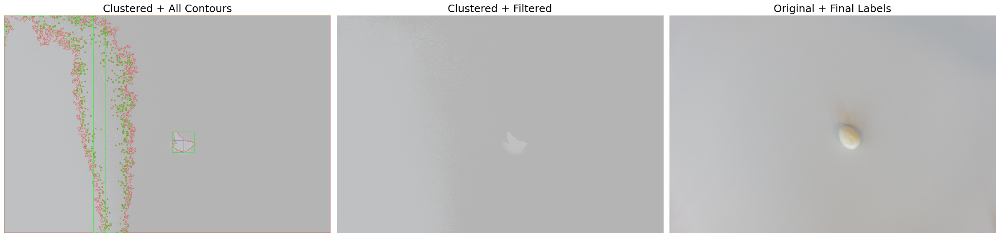

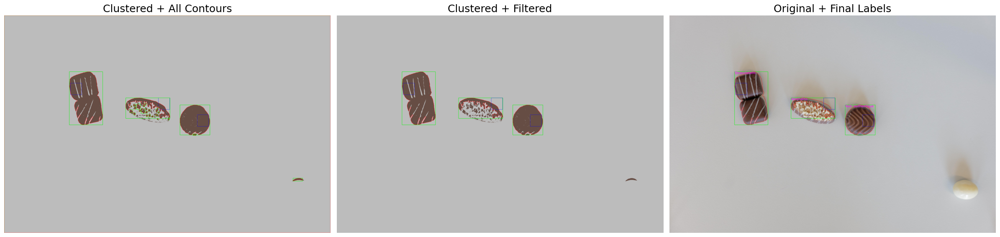

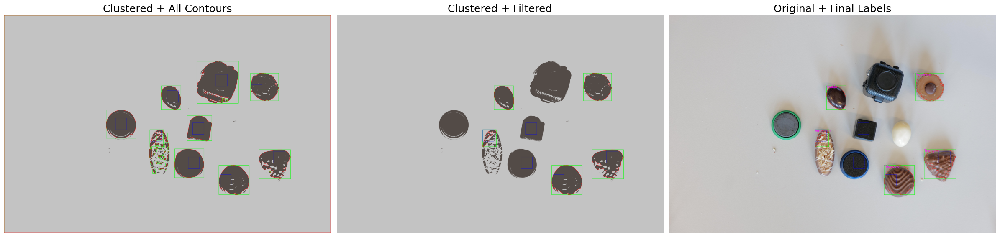

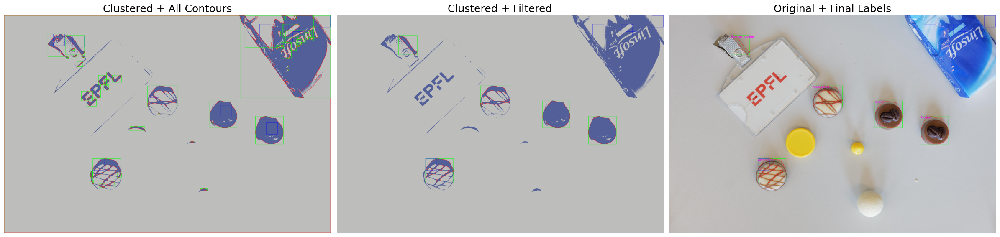

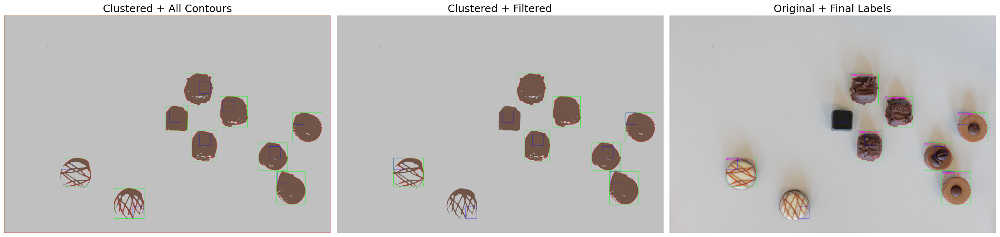

...

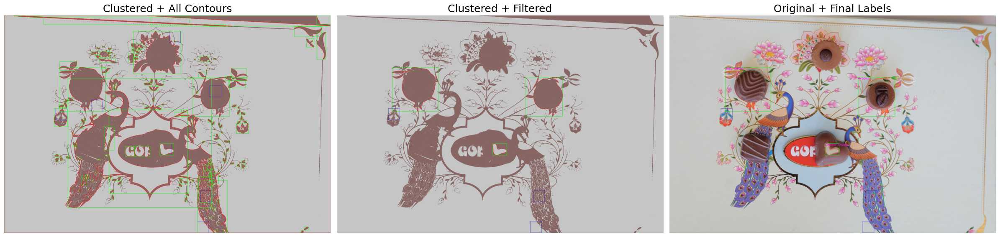

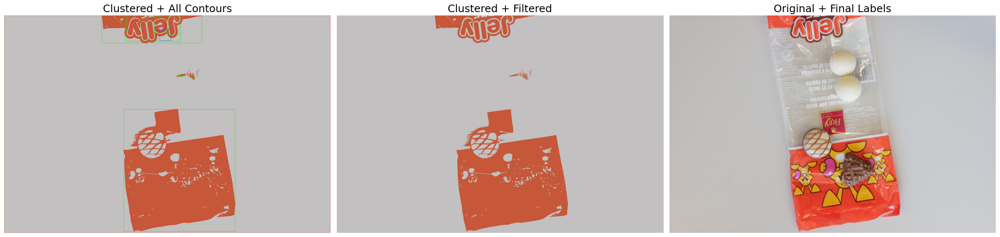

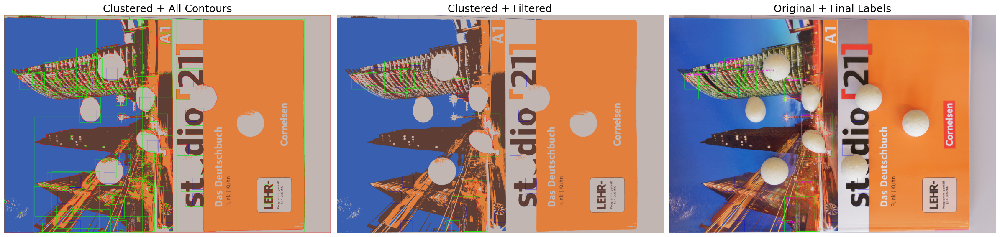

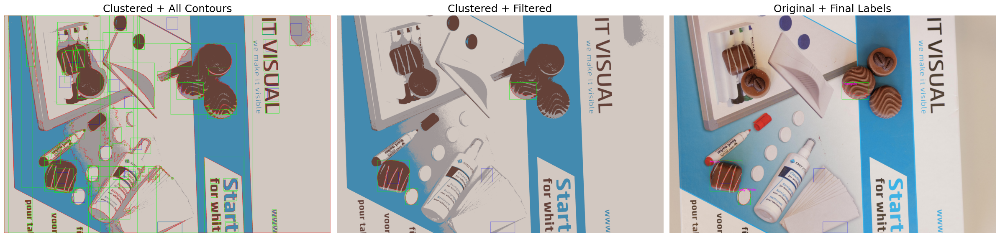

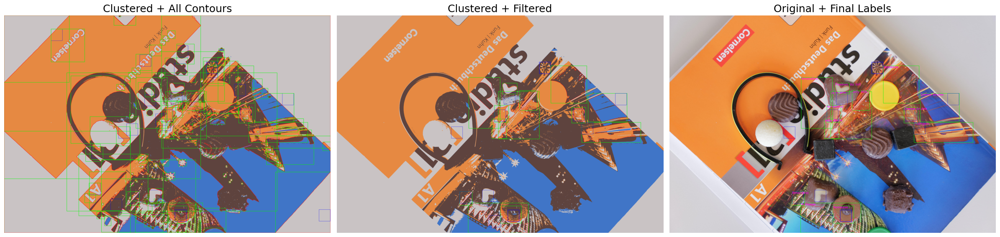

KeyboardInterrupt: 

In [67]:
test_folder = r'images\valid_small'
for img_path in glob(os.path.join(test_folder, "*.jpg")):
    process_image_kmeans_only_debug(img_path, ref_histograms, ref_object_histograms)

## Generate CSV

Must adapt the names, had to be done by hand

In [ ]:
import itertools

def compute_overlap_ratio(box1, box2):
    # (x, y, w, h)
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    # Convert to x_min, y_min, x_max, y_max
    xa1, ya1, xa2, ya2 = x1, y1, x1 + w1, y1 + h1
    xb1, yb1, xb2, yb2 = x2, y2, x2 + w2, y2 + h2

    # Compute intersection
    xi1 = max(xa1, xb1)
    yi1 = max(ya1, yb1)
    xi2 = min(xa2, xb2)
    yi2 = min(ya2, yb2)

    iw = max(0, xi2 - xi1)
    ih = max(0, yi2 - yi1)
    inter_area = iw * ih

    area1 = w1 * h1
    area2 = w2 * h2
    overlap_ratio = inter_area / min(area1, area2) if min(area1, area2) > 0 else 0


    return overlap_ratio

def filter_overlapping_boxes(detections, overlap_thresh=0.1):
    keep = [True] * len(detections)

    for i, j in itertools.combinations(range(len(detections)), 2):
        if not keep[i] or not keep[j]:
            continue

        boxA = detections[i]['bbox']
        boxB = detections[j]['bbox']
        overlap = compute_overlap_ratio(boxA, boxB)

        if overlap >= overlap_thresh:
            # Compare scores
            if detections[i]['score'] >= detections[j]['score']:
                keep[j] = False
            else:
                keep[i] = False

    return [det for k, det in enumerate(detections) if keep[k]]




In [88]:
# Expected labels (MUST match what your `load_reference_histograms` returns!)
EXPECTED_LABELS = [
    "Jelly White", "Jelly Milk", "Jelly Black", "Amandina", "Creme brulee",
    "Triangolo", "Tentation noir", "Comtesse", "Noblesse", "Noir authentique",
    "Passion au lait", "Arabia", "Stracciatella"
]

In [ ]:
def process_image_for_counts_updated(img_path, reference_histograms, reference_histograms_objects):
    img = cv2.imread(img_path)
    if img is None:
        print(f"Error loading image: {img_path}")
        return None

    # --- NEW: Choose k adaptively
    k = choose_k_by_colorfulness(img)[0]

    clustered_img, labels = kmeans_clustering(img, k)
    class_masks = extract_class_masks(labels, num_classes=k)

    detected = []
    detected = filter_overlapping_boxes(detected, overlap_thresh=0.1)

    for mask in class_masks:
        # --- NEW: Disconnect thin connections
        mask_disconnected = disconnect_thin_structures(mask)
        cleaned = clean_mask(mask_disconnected)

        contours = get_contours_from_mask(cleaned)
        for cnt in contours:
            x, y, w, h = cv2.boundingRect(cnt)
            roi = img[y:y+h, x:x+w]
            if roi.size == 0:
                continue

            hist = extract_histogram(img, cnt)[0]
            best_label = match_histogram_dual(hist, reference_histograms, reference_histograms_objects)

            if best_label:  # Only if matched to chocolate
                score = cv2.compareHist(hist, reference_histograms[best_label], cv2.HISTCMP_CORREL)
                detected.append({
                    'contour': cnt,
                    'label': best_label,
                    'score': score,
                    'bbox': (x, y, x + w, y + h),
                })

    # --------- Overlap filtering ---------
    keep = [True] * len(detected)
    for i, j in itertools.combinations(range(len(detected)), 2):
        if not keep[i] or not keep[j]:
            continue
        boxA, boxB = detected[i]['bbox'], detected[j]['bbox']
        overlap = compute_overlap_ratio(boxA, boxB)
        if overlap >= 0.1:
            if detected[i]['score'] >= detected[j]['score']:
                keep[j] = False
            else:
                keep[i] = False

    # --------- Count final labels ---------
    counts = {label: 0 for label in EXPECTED_LABELS}
    for i, d in enumerate(detected):
        if keep[i] and d['label'] in counts:
            counts[d['label']] += 1

    return counts


In [106]:
def generate_csv(test_folder, reference_histograms, reference_histograms_objects, output_csv):
    with open(output_csv, mode='w', newline='') as f:
        writer = csv.writer(f)
        writer.writerow(['id'] + EXPECTED_LABELS)  # Header

        for img_path in glob(os.path.join(test_folder, '*.jpg')):
            filename = os.path.basename(img_path)

            # Extract image ID
            if filename.lower().startswith('l') and filename.lower().endswith('.jpg'):
                img_id = filename[1:filename.lower().rindex('.')]  # e.g., L1000757.JPG → 1000757
            else:
                print(f"Unexpected filename format: {filename}")
                continue

            # Use the updated version that accepts both histogram sets
            counts = process_image_for_counts_updated(img_path, reference_histograms, reference_histograms_objects)

            if counts is not None:
                row = [img_id] + [counts[label] for label in EXPECTED_LABELS]
                writer.writerow(row)
                print(f"Processed: {img_id}")


In [ ]:
generate_csv(
    test_folder=r'images\test',
    reference_histograms=ref_histograms,
    reference_histograms_objects=ref_object_histograms,
    output_csv='chocolate_counts_4.csv'
)

Processed: 1000757
Processed: 1000758
Processed: 1000759
Processed: 1000760
Processed: 1000761
Processed: 1000762
Processed: 1000764
Processed: 1000766
Processed: 1000767
Processed: 1000769
Processed: 1000770
Processed: 1000773
Processed: 1000774
Processed: 1000775
Processed: 1000776
Processed: 1000777
Processed: 1000778
Processed: 1000781
Processed: 1000782
Processed: 1000783
Processed: 1000784
Processed: 1000786
Processed: 1000789
Processed: 1000790
Processed: 1000794
Processed: 1000795
Processed: 1000796
Processed: 1000798
Processed: 1000800
Processed: 1000801
Processed: 1000806
Processed: 1000807
Processed: 1000809
Processed: 1000811
Processed: 1000813
Processed: 1000814
Processed: 1000816
Processed: 1000818
Processed: 1000819
Processed: 1000822
Processed: 1000823
Processed: 1000824
Processed: 1000825
Processed: 1000829
Processed: 1000830
Processed: 1000832
Processed: 1000833
Processed: 1000834
Processed: 1000835
Processed: 1000837
Processed: 1000839
Processed: 1000840
Processed: 1